In [1]:
# Imports
from importlib import reload
from matplotlib.backends.backend_pdf import PdfPages
from scipy import sparse
from scipy import stats
from sklearn import neighbors
from sklearn.decomposition import PCA
from sklearn.feature_selection import f_regression
from sklearn.linear_model import LinearRegression
from sklearn.manifold import TSNE
import sklearn
from sklearn.metrics import pairwise_distances
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.metrics.pairwise import cosine_distances
from sklearn.metrics.pairwise import rbf_kernel
from sklearn.neighbors import BallTree
from sklearn.neighbors import NearestNeighbors
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import Normalizer
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import normalize
from sklearn.preprocessing import KBinsDiscretizer
from umap import UMAP
import anndata as ad
import json
import math
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import polars as pl
import polars.selectors as cs
import scanpy as sc
import seaborn as sns
import sklearn as sk
import statsmodels.api as sm
import sys
import typing
import umap
import warnings
warnings.filterwarnings('ignore')
# local imports
import slamutils
import re
from scipy.sparse import csr_array, csr_matrix
from scipy.sparse.csgraph import maximum_bipartite_matching

import mygene
import toolz
from toolz import curry
from scipy.stats import mannwhitneyu, brunnermunzel
from sklearn.metrics.pairwise import pairwise_kernels
import scipy
import time
from scipy import linalg
from scipy.sparse.csgraph import shortest_path

/home/zelhar/micromamba/envs/exovelo/lib/python3.11/site-packages/louvain/__init__.py:54: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import get_distribution, DistributionNotFound


In [2]:
#import scvelo as scv
import matplotlib

class mplDeprecation(UserWarning):
    pass

matplotlib.cbook.mplDeprecation = mplDeprecation

import scvelo as scv

In [3]:
import os
save_dir = "./plots/Bonemarrow_Brigitte/"
save_dir = os.path.abspath(save_dir)
if not os.path.exists(save_dir):
    os.makedirs(save_dir)
print(save_dir, os.path.exists(save_dir))

/home/zelhar/my_gits/exovelo_paper/code/plots/Bonemarrow_Brigitte True


## Bonemarrow datasets from brigitte

In [6]:
sc.set_figure_params(dpi=60,)
adata= sc.read_h5ad("./data/hspc_brigitte_with_clusters_and_colors.h5ad")
slamutils.unsparseAnnData(adata)
adata

AnnData object with n_obs × n_vars = 2430 × 31053
    obs: 'original_clusters', 'cell_type'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    uns: 'cell_type_colors', 'original_clusters_colors'
    obsm: 'X_umap', 'original_umap'
    layers: 'ambiguous', 'matrix', 'spliced', 'total', 'unspliced'

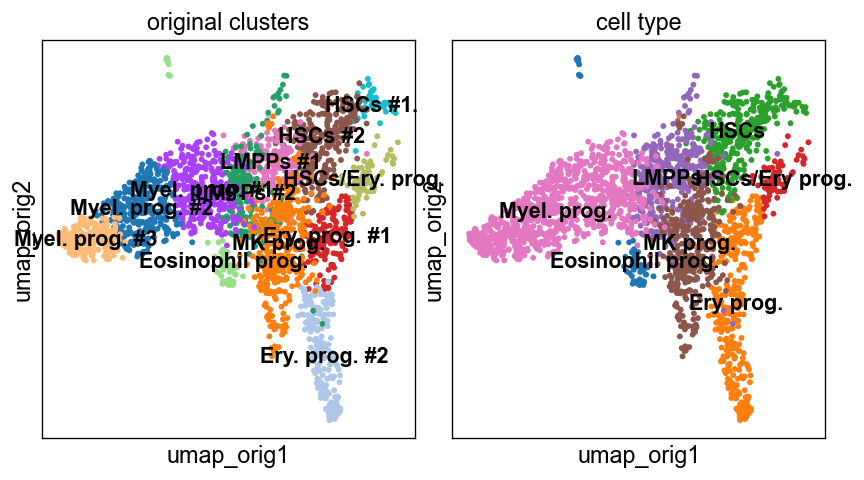

In [7]:
adata.obsm['X_umap_orig'] = adata.obsm['original_umap'].copy()
sc.pl.scatter(
    adata,
    basis='umap_orig',
    color=['original_clusters' , 'cell_type'],
    legend_loc='on data',
)

In [8]:
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=50)
adata

AnnData object with n_obs × n_vars = 2430 × 10679
    obs: 'original_clusters', 'cell_type', 'n_genes'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'n_cells'
    uns: 'cell_type_colors', 'original_clusters_colors'
    obsm: 'X_umap', 'original_umap', 'X_umap_orig'
    layers: 'ambiguous', 'matrix', 'spliced', 'total', 'unspliced'

In [10]:
### load cell cycle genes
cc_path = "./data/gene_lists_brigitte/cell_cycle_marker_genes.csv"
cc_markers = pd.read_csv(cc_path, sep=";")
cc_markers = cc_markers["gene"].values
cc_markers = np.unique(cc_markers)

In [11]:
### make subset of control; remove cell cycle genes 
adata = adata[:,np.setdiff1d(adata.var_names,cc_markers)].copy()
adata

AnnData object with n_obs × n_vars = 2430 × 10077
    obs: 'original_clusters', 'cell_type', 'n_genes'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'n_cells'
    uns: 'cell_type_colors', 'original_clusters_colors'
    obsm: 'X_umap', 'original_umap', 'X_umap_orig'
    layers: 'ambiguous', 'matrix', 'spliced', 'total', 'unspliced'

In [12]:
sc.pp.normalize_total(
    adata,
    key_added='sizeF',
    inplace=True,
    #target_sum=1e4,
)
sc.pp.log1p(adata,)
sc.pp.highly_variable_genes(adata, n_top_genes=2000, subset=True,)
slamutils.unsparseAnnData(adata,)


adata

AnnData object with n_obs × n_vars = 2430 × 2000
    obs: 'original_clusters', 'cell_type', 'n_genes', 'sizeF'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'cell_type_colors', 'original_clusters_colors', 'log1p', 'hvg'
    obsm: 'X_umap', 'original_umap', 'X_umap_orig'
    layers: 'ambiguous', 'matrix', 'spliced', 'total', 'unspliced'

In [13]:
sc.pp.scale(adata, max_value=10,)
sc.pp.pca(adata,n_comps=30)
sc.pp.neighbors(adata, n_neighbors=15, method='umap', knn=True, metric='euclidean', use_rep='X_pca',)
adata.uns['iroot'] = 0
sc.tl.umap(adata, )
sc.tl.leiden(adata, directed=False)
sc.tl.draw_graph(adata)
sc.tl.diffmap(adata, )
sc.tl.dpt(adata, )

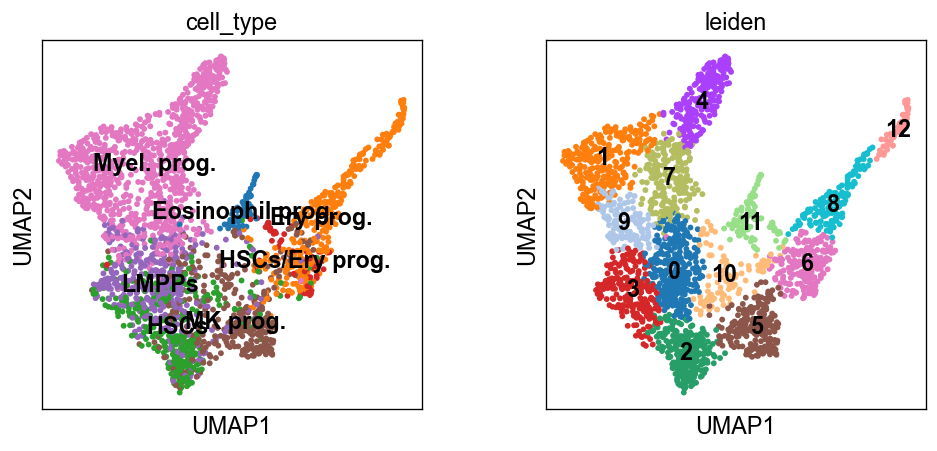

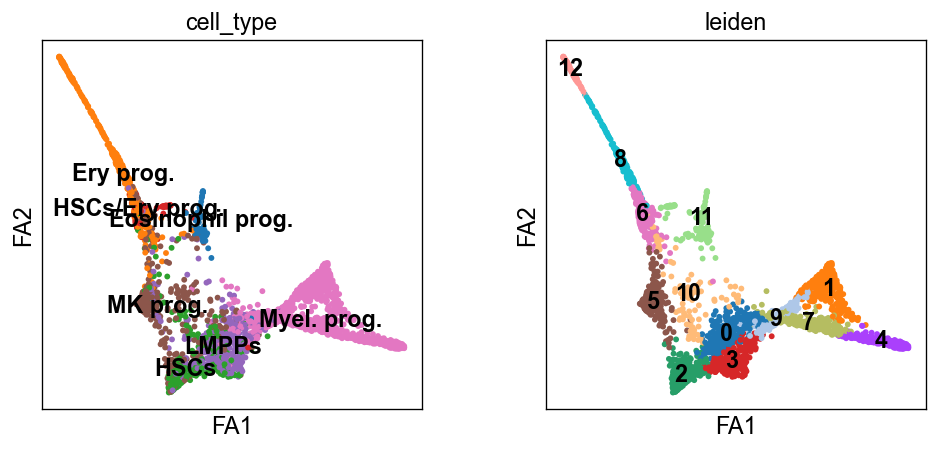

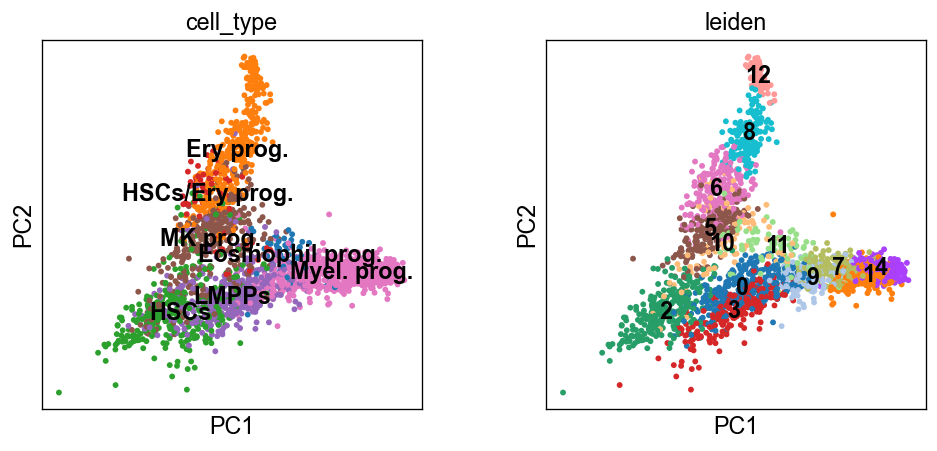

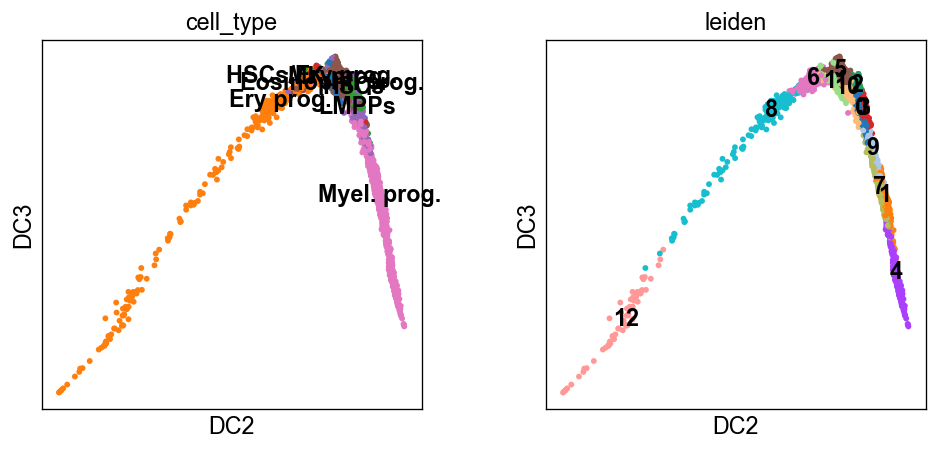

In [14]:
sc.pl.umap(adata, color=['cell_type', 'leiden',  ], ncols=3, legend_loc='on data')
sc.pl.draw_graph(adata, color=['cell_type', 'leiden', ], ncols=3,  legend_loc='on data')
sc.pl.pca(adata, color=['cell_type', 'leiden', ], ncols=3,  legend_loc='on data')
sc.pl.diffmap(adata, color=['cell_type', 'leiden', ], ncols=3,  legend_loc='on data', dimensions=[(1,2)],)

In [15]:
np.allclose(adata.layers['total'], adata.layers['spliced'] + adata.layers['unspliced'])

True

In [16]:
adata.layers['spliced'].sum(), adata.layers['unspliced'].sum(), 

(8980921, 1678229)

In [17]:
sc.tl.rank_genes_groups(adata, 'leiden', method='wilcoxon', key_added="rank_leiden",)
mygenes = np.array(adata.uns['rank_leiden']['names'][:100].flatten().tolist()).flatten().tolist()
print(len(mygenes), )

1300


In [18]:
tots = adata.layers['total'].sum(axis=1, keepdims=True,)
sp = adata.layers['spliced'].sum(axis=1, keepdims=True,)
usp = adata.layers['unspliced'].sum(axis=1, keepdims=True,)
factor = 1e4
adata.layers['Rn'] = normalize(adata.layers['total'], axis=1, norm='l1') * factor
adata.layers['Sn'] = normalize(adata.layers['spliced'], axis=1, norm='l1') * factor * sp / tots
adata.layers['Un'] = normalize(adata.layers['unspliced'], axis=1, norm='l1') * factor * usp / tots

adata

AnnData object with n_obs × n_vars = 2430 × 2000
    obs: 'original_clusters', 'cell_type', 'n_genes', 'sizeF', 'leiden', 'dpt_pseudotime'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'cell_type_colors', 'original_clusters_colors', 'log1p', 'hvg', 'pca', 'neighbors', 'iroot', 'umap', 'leiden', 'draw_graph', 'diffmap_evals', 'leiden_colors', 'rank_leiden'
    obsm: 'X_umap', 'original_umap', 'X_umap_orig', 'X_pca', 'X_draw_graph_fa', 'X_diffmap'
    varm: 'PCs'
    layers: 'ambiguous', 'matrix', 'spliced', 'total', 'unspliced', 'Rn', 'Sn', 'Un'
    obsp: 'distances', 'connectivities'

In [19]:
foo = adata.layers['Un'].copy()
foo = np.where(foo > 0, foo, 100)
np.log(foo.min())

-0.6588662465830711

In [20]:
foo = adata.layers['Sn'].copy()
foo = np.where(foo > 0, foo, 100)
np.log(foo.min())

-0.6588662465830711

In [21]:
foo = adata.layers['Rn'].copy()
foo = np.where(foo > 0, foo, 100)
np.log(foo.min())

-0.6588662465830711

In [22]:
foo = adata.layers['Rn'].copy()
foo = np.where(foo > 0, foo, 100)
foo.min()

0.517437648763324

In [23]:
np.log(0.5 * foo.min())

-1.3520134271430164

In [24]:
lpc = np.log(0.5 * foo.min())
adata.layers['Rnl'] = np.nan_to_num(np.log(adata.layers['Rn']), neginf=lpc)
adata.layers['Snl'] = np.nan_to_num(np.log(adata.layers['Sn']), neginf=lpc)

scaler = StandardScaler
adata.layers['Sn_st'] = scaler().fit_transform(adata.layers['Sn'])
adata.layers['Rn_st'] = scaler().fit_transform(adata.layers['Rn'])

adata.layers['Snl_st'] = scaler().fit_transform(adata.layers['Snl'])
adata.layers['Rnl_st'] = scaler().fit_transform(adata.layers['Rnl'])

adata

AnnData object with n_obs × n_vars = 2430 × 2000
    obs: 'original_clusters', 'cell_type', 'n_genes', 'sizeF', 'leiden', 'dpt_pseudotime'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'cell_type_colors', 'original_clusters_colors', 'log1p', 'hvg', 'pca', 'neighbors', 'iroot', 'umap', 'leiden', 'draw_graph', 'diffmap_evals', 'leiden_colors', 'rank_leiden'
    obsm: 'X_umap', 'original_umap', 'X_umap_orig', 'X_pca', 'X_draw_graph_fa', 'X_diffmap'
    varm: 'PCs'
    layers: 'ambiguous', 'matrix', 'spliced', 'total', 'unspliced', 'Rn', 'Sn', 'Un', 'Rnl', 'Snl', 'Sn_st', 'Rn_st', 'Snl_st', 'Rnl_st'
    obsp: 'distances', 'connectivities'

In [25]:
np.log(0.0)
adata.layers['Sn'].min()
adata.layers['Sn'].max()
np.log(adata.layers['Sn']).min()
np.nan_to_num(np.log(adata.layers['Sn']), neginf=np.log(0.5)).min()
adata.layers['Snl'].max(), adata.layers['Snl'].min()

(8.112658315933293, -1.3520134271430164)

In [26]:
n_genes = len(mygenes) // 100 * 50
n_genes

650

In [27]:
n = adata.n_obs
n_components = 50 #ok
#n_genes = 9 * 40
X = adata[:,mygenes[:n_genes]].layers['Snl_st'].copy()
Y = adata[:,mygenes[:n_genes]].layers['Rnl_st'].copy() 
X = adata[:,mygenes[:n_genes]].layers['Sn_st'].copy()
Y = adata[:,mygenes[:n_genes]].layers['Rn_st'].copy() 
dX = Y - X
XY = np.concatenate((X,Y), axis=0)
pca = PCA(n_components=n_components,).fit(XY)
Xp = pca.transform(X)
Yp = pca.transform(Y)
treeX = BallTree(Xp, metric='minkowski', p=2)
k=16
k=8
distXX, indXX = treeX.query(Xp, k=k)
Z = X + dX[indXX].mean(1)
Zp = pca.transform(Z)

In [28]:
n = adata.n_obs
np.random.seed(42)
#embd = "X_diffmap"
#embd = "X_pca"
#embd = "X_umap"
#embd = "X_draw_graph_fa"
#embd = "X_tsne"
startind = 1
startind = 2
startind = 0

Y0 = pca.transform(X)[:,startind:]
Y1 = pca.transform(Y)[:,startind:]
Y2 = pca.transform(Z)[:,startind:]

V = (Y1 - Y0)[indXX].mean(1)
U = (Y2 - Y0)[indXX].mean(1)
V = (Y1 - Y0)
U = (Y2 - Y0)

f_medium = 21
f_large = 28


fig, ax = plt.subplots(dpi=300, figsize=(20,13),)

key='clusters'
key='cell_type'
for phase in np.unique(adata.obs[key].to_numpy()):
    ms = adata.obs[key].to_numpy() == phase
    ax.scatter(
        Y0[:,0][ms],
        Y0[:,1][ms],
        #color = adata.uns['clusters_color_dict'][phase],
        label=str(phase),
    )
    ax.legend(fontsize=f_medium)
ax.set_title("Hematopoiesis ctrl, hvg genes", fontsize=f_large)
ax.set_xlabel('embedding 1', fontsize=f_medium)
ax.set_ylabel('embedding 2', fontsize=f_medium)

mask = np.random.rand(n) > 0.75

ax.quiver(
    Y0[mask,0],
    Y0[mask,1],
    V[mask][:,0],
    V[mask][:,1],
    color="gray",
    angles="xy", scale=1.0e-0, scale_units="xy",pivot='tail',
    width=0.0015,
)

ax.quiver(
    Y0[mask,0],
    Y0[mask,1],
    U[mask][:,0],
    U[mask][:,1],
    color="black",
    angles="xy", scale=1.0e-0, scale_units="xy",pivot='tail',
    width=0.0015,
)

#ax.set_xticks([])
#ax.set_yticks([])

plt.savefig(f"{save_dir}just_pca.pdf", dpi=100, bbox_inches='tight', backend='cairo', transparent=True,)

In [29]:
bdata = sc.AnnData(
    X = np.concatenate((X,Y,Z), axis=0),
    obs = {
        'cell_type' : np.concatenate([adata.obs['cell_type'], adata.obs['cell_type'], adata.obs['cell_type']], axis=0),
        #'clusters' : np.concatenate([adata.obs['clusters'], adata.obs['clusters'], adata.obs['clusters']], axis=0),
        'mode' : adata.n_obs * ['spliced'] + adata.n_obs * ['total'] + adata.n_obs * ['pred_drift'],
    },
    uns = adata.uns.copy(),
    var = adata[:,mygenes[:n_genes]].var.copy(),
    #var = adata.var.copy(),
    )
bdata

AnnData object with n_obs × n_vars = 7290 × 650
    obs: 'cell_type', 'mode'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'cell_type_colors', 'original_clusters_colors', 'log1p', 'hvg', 'pca', 'neighbors', 'iroot', 'umap', 'leiden', 'draw_graph', 'diffmap_evals', 'leiden_colors', 'rank_leiden'

In [30]:
n_components = 16 # 
n_components = 8 # 
n_components = 30 # good
n_components = 15 # maybe
n_components = 20 # maybe

n_neighbors = 35 #good
n_neighbors = 25 #good
n_neighbors = 22 #maybe
n_neighbors =15

sc.pp.scale(bdata, max_value=10,)
sc.pp.pca(bdata, n_comps=n_components,)
sc.pp.neighbors(bdata, n_neighbors=n_neighbors, method='umap', knn=True, metric='euclidean', use_rep='X_pca',)
#bdata.uns['iroot'] = np.flatnonzero(bdata.obs['clusters'] == 'HSC_1')[0]
bdata.uns['iroot'] = 0

In [31]:
sc.tl.umap(bdata,)
#sc.tl.umap(bdata, spread=2, min_dist=2,)
sc.tl.diffmap(bdata, )
sc.tl.dpt(bdata, )
sc.tl.draw_graph(bdata)
sc.tl.leiden(bdata, directed=False)
#sc.tl.leiden(bdata, flavor="igraph", n_iterations=2, directed=False)

In [32]:
#"drift"
ydata = bdata[:n].copy()
ydata.layers['Ms'] = bdata[:n].X.copy()
ydata.layers['velocity'] = bdata[2*n:].X.copy() - bdata[:n].X.copy()
ydata.obsm['velocity_umap'] = bdata[2*n:].obsm['X_umap'] - bdata[:n].obsm['X_umap']
ydata.obsm['velocity_pca'] = bdata[2*n:].obsm['X_pca'] - bdata[:n].obsm['X_pca']
ydata.obsm['velocity_diffmap'] = bdata[2*n:].obsm['X_diffmap'] - bdata[:n].obsm['X_diffmap']
ydata.obsm['velocity_draw_graph_fa'] = bdata[2*n:].obsm['X_draw_graph_fa'] - bdata[:n].obsm['X_draw_graph_fa']

dist, ind = treeX.query(Xp, k=12)
ydata.obsm['X_umap_smooth'] = ydata.obsm['X_umap'].copy()
ydata.obsm['velocity_umap_smooth'] = ydata.obsm['velocity_umap'][ind].mean(1)

In [33]:
#"diffusion+drift"
xdata = bdata[:n].copy()
xdata.layers['Ms'] = bdata[:n].X.copy()
xdata.layers['velocity'] = bdata[n:2*n].X.copy() - bdata[:n].X.copy()
xdata.obsm['velocity_umap'] = bdata[n:2*n].obsm['X_umap'] - bdata[:n].obsm['X_umap']
xdata.obsm['velocity_pca'] = bdata[n:2*n].obsm['X_pca'] - bdata[:n].obsm['X_pca']
xdata.obsm['velocity_diffmap'] = bdata[n:2*n].obsm['X_diffmap'] - bdata[:n].obsm['X_diffmap']
xdata.obsm['velocity_draw_graph_fa'] = bdata[n:2*n].obsm['X_draw_graph_fa'] - bdata[:n].obsm['X_draw_graph_fa']

xdata.obsm['X_umap_smooth'] = xdata.obsm['X_umap'].copy()
xdata.obsm['velocity_umap_smooth'] = xdata.obsm['velocity_umap'][ind].mean(1)

In [34]:
xdata.obs.cell_type = pd.Categorical(xdata.obs.cell_type)
ydata.obs.cell_type = pd.Categorical(ydata.obs.cell_type)
#xdata.obs.clusters = pd.Categorical(xdata.obs.clusters)
#ydata.obs.clusters = pd.Categorical(ydata.obs.clusters)

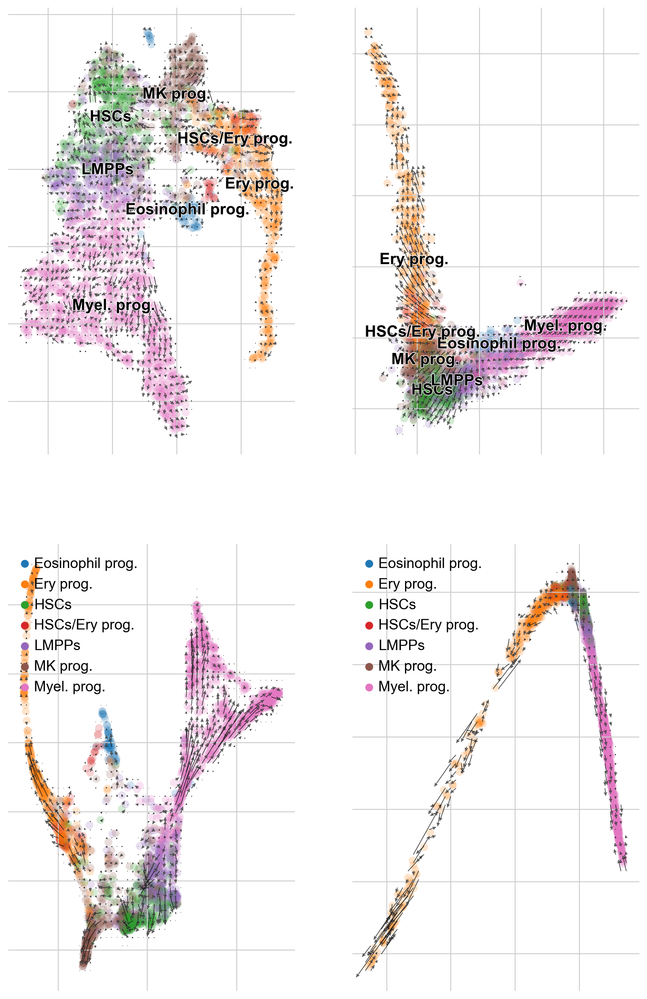

In [35]:
ords = np.arange(xdata.n_obs)
np.random.shuffle(ords)
basis = 'pca'
basis = 'umap'
#fig, axs = plt.subplots(dpi=300, figsize=(10,6), nrows=2, ncols=2)
fig, axs = plt.subplots(dpi=100, figsize=(10,16), nrows=2, ncols=2)
ax1 = scv.pl.velocity_embedding_grid(
    ydata[ords],
    basis=basis,
    dpi=300,
    #legend_loc='best', 
    legend_loc='on data', 
    show=False,
    #ax=ax,
    ax=axs[0,0],
    #color=['time', ],
    color=['cell_type', ],
    #title='drift',
    title='',
    arrow_length=2,
    arrow_size=2,
    #save="./temp_figs/Bonemarrow_umap_grid.svg",
)
basis = 'umap'
basis = 'pca'
ax1 = scv.pl.velocity_embedding_grid(
    ydata[ords],
    basis=basis,
    dpi=100,
    #legend_loc='best', 
    legend_loc='on data', 
    show=False,
    #ax=ax,
    ax=axs[0,1],
    #color=['time', ],
    color=['cell_type', ],
    #title='diffusion + drift',
    title='',
    arrow_length=2,
    arrow_size=2,
    #save="./temp_figs/Bonemarrow_umap_grid.svg",
)
basis = 'draw_graph_fa'
ax1 = scv.pl.velocity_embedding_grid(
    ydata[ords],
    basis=basis,
    dpi=100,
    legend_loc='best', 
    #legend_loc='on data', 
    show=False,
    #ax=ax,
    ax=axs[1,0],
    #color=['time', ],
    color=['cell_type', ],
    #title='diffusion + drift',
    title='',
    arrow_length=2,
    arrow_size=2,
    #save="./temp_figs/Bonemarrow_umap_grid.svg",
)
basis = 'diffmap'
ax1 = scv.pl.velocity_embedding_grid(
    ydata[ords],
    basis=basis,
    dpi=100,
    legend_loc='best', 
    #legend_loc='on data', 
    show=False,
    #ax=ax,
    ax=axs[1,1],
    #color=['time', ],
    color=['cell_type', ],
    #title='diffusion + drift',
    title='',
    arrow_length=2,
    arrow_size=2,
    #save="./temp_figs/Bonemarrow_umap_grid.svg",
)

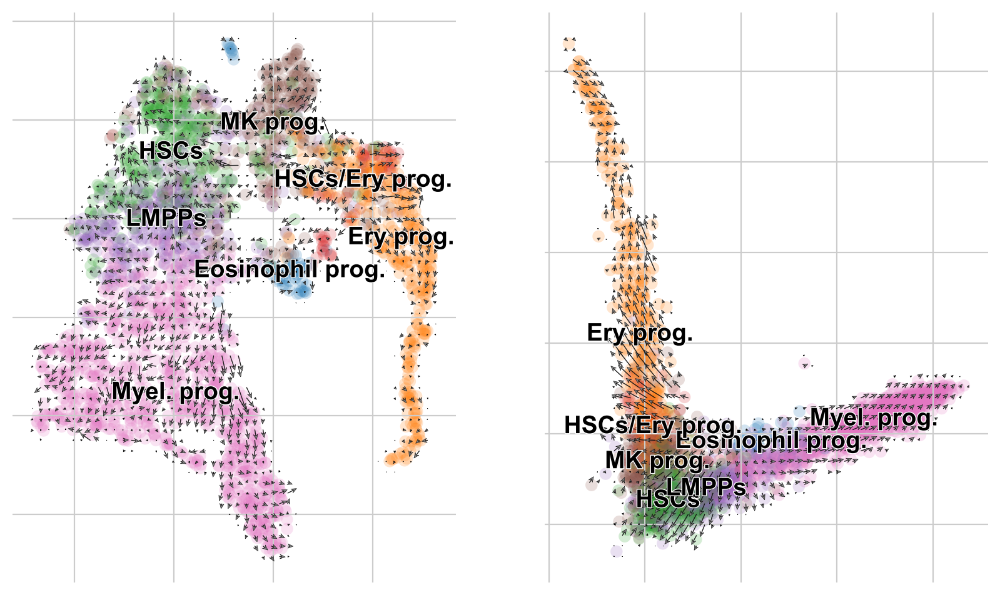

In [36]:
ords = np.arange(xdata.n_obs)
np.random.shuffle(ords)
basis = 'diffmap'
basis = 'pca'
basis = 'umap'
fig, axs = plt.subplots(dpi=100, figsize=(10,6), nrows=1, ncols=2)
ax1 = scv.pl.velocity_embedding_grid(
    ydata[ords],
    basis=basis,
    dpi=100,
    #legend_loc='best', 
    legend_loc='on data', 
    show=False,
    #ax=ax,
    ax=axs[0],
    #color=['time', ],
    color=['cell_type', ],
    #title='drift',
    title='',
    arrow_length=2,
    arrow_size=2,
    #save="./temp_figs/Bonemarrow_umap_grid.svg",
)
basis = 'umap'
basis = 'draw_graph_fa'
basis = 'pca'
ax1 = scv.pl.velocity_embedding_grid(
    ydata[ords],
    basis=basis,
    dpi=100,
    #legend_loc='best', 
    legend_loc='on data', 
    show=False,
    #ax=ax,
    ax=axs[1],
    #color=['time', ],
    color=['cell_type', ],
    #title='diffusion + drift',
    title='',
    arrow_length=2,
    arrow_size=2,
    #save="./temp_figs/Bonemarrow_umap_grid.svg",
)

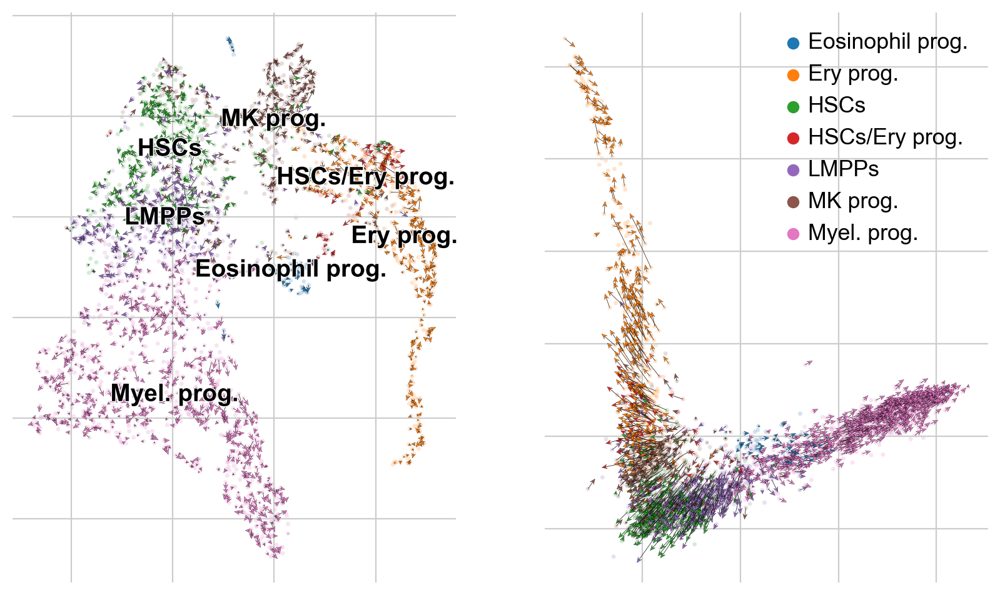

In [37]:
ords = np.arange(xdata.n_obs)
np.random.shuffle(ords)
basis = 'diffmap'
basis = 'pca'
basis = 'umap'
fig, axs = plt.subplots(dpi=100, figsize=(10,6), nrows=1, ncols=2)
ax1 = scv.pl.velocity_embedding(
    ydata[ords],
    basis=basis,
    dpi=100,
    #legend_loc='best', 
    legend_loc='on data', 
    show=False,
    #ax=ax,
    ax=axs[0],
    #color=['time', ],
    color=['cell_type', ],
    #title='drift',
    title='',
    arrow_length=2,
    arrow_size=2,
    density=0.71,
    #save="./temp_figs/Bonemarrow_umap_grid.svg",
)
basis = 'umap'
basis = 'draw_graph_fa'
basis = 'pca'
ax1 = scv.pl.velocity_embedding(
    ydata[ords],
    basis=basis,
    dpi=100,
    legend_loc='best', 
    #legend_loc='on data', 
    show=False,
    #ax=ax,
    ax=axs[1],
    #color=['time', ],
    arrow_length=2,
    arrow_size=2,
    density=0.71,
    color=['cell_type', ],
    #title='diffusion + drift',
    title='',
    #save="./temp_figs/Bonemarrow_umap_grid.svg",
)

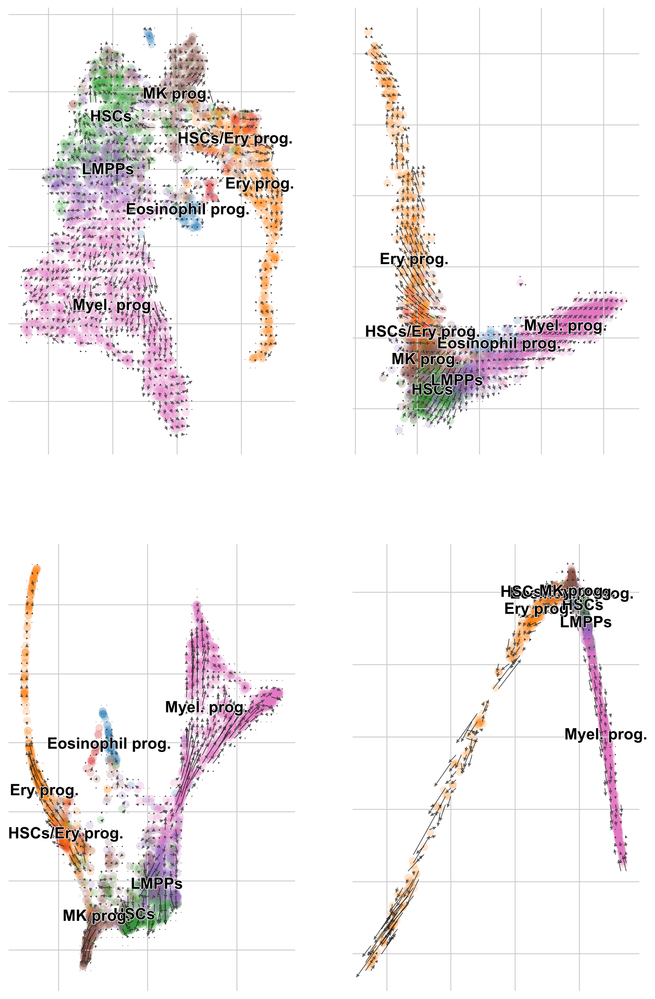

In [38]:
ords = np.arange(xdata.n_obs)
np.random.shuffle(ords)
fig, axs = plt.subplots(dpi=100, figsize=(10,16), nrows=2, ncols=2)
basis = 'draw_graph_fa'
basis = 'diffmap'
basis = 'pca'
basis = 'umap'
ax1 = scv.pl.velocity_embedding_grid(
    ydata[ords],
    basis=basis,
    dpi=100,
    #legend_loc='best', 
    legend_loc='on data', 
    show=False,
    #ax=ax,
    ax=axs[0,0],
    #color=['time', ],
    color=['cell_type', ],
    #title='umap',
    title='',
    arrow_length=2,
    arrow_size=2,
    #save="./temp_figs/Bonemarrow_umap_grid.svg",
)
basis = 'pca'
ax1 = scv.pl.velocity_embedding_grid(
    ydata[ords],
    basis=basis,
    dpi=100,
    #legend_loc='best', 
    legend_loc='on data', 
    show=False,
    #ax=ax,
    ax=axs[0,1],
    #color=['time', ],
    color=['cell_type', ],
    #title='umap',
    title='',
    arrow_length=2,
    arrow_size=2,
    #save="./temp_figs/Bonemarrow_umap_grid.svg",
)
basis = 'draw_graph_fa'
ax1 = scv.pl.velocity_embedding_grid(
    ydata[ords],
    basis=basis,
    dpi=100,
    #legend_loc='best', 
    legend_loc='on data', 
    show=False,
    #ax=ax,
    ax=axs[1,0],
    #color=['time', ],
    color=['cell_type', ],
    title='',
    arrow_length=2,
    arrow_size=2,
    #title='umap',
    #save="./temp_figs/Bonemarrow_umap_grid.svg",
)
basis = 'diffmap'
ax1 = scv.pl.velocity_embedding_grid(
    ydata[ords],
    basis=basis,
    dpi=100,
    #legend_loc='best', 
    legend_loc='on data', 
    show=False,
    #ax=ax,
    ax=axs[1,1],
    #color=['time', ],
    color=['cell_type', ],
    #title='umap',
    title='',
    arrow_length=2,
    arrow_size=2,
    #save="./temp_figs/Bonemarrow_umap_grid.svg",
)

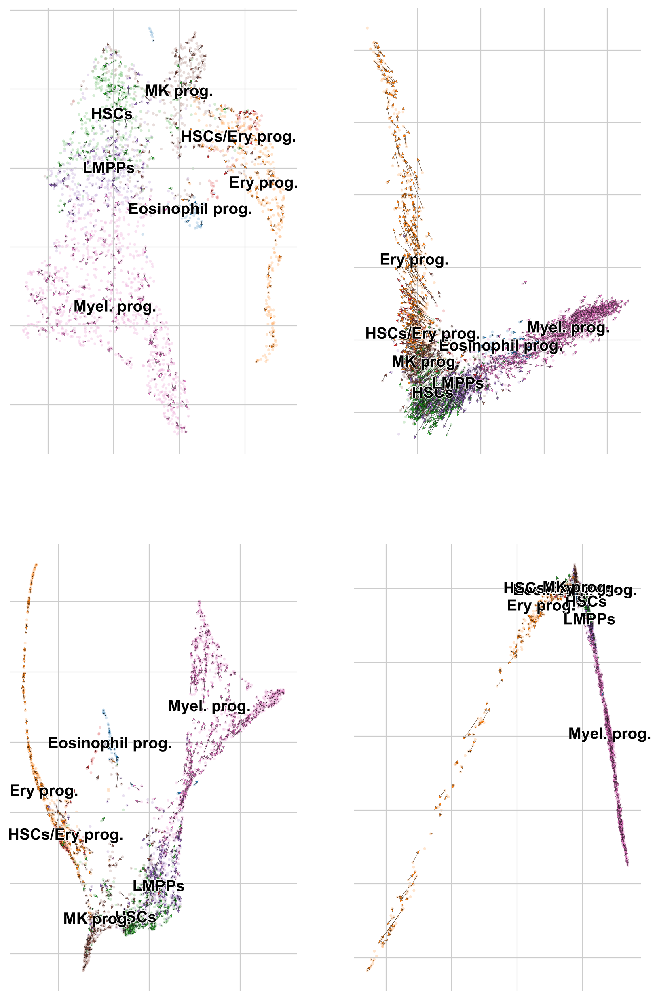

In [39]:
ords = np.arange(xdata.n_obs)
np.random.shuffle(ords)
fig, axs = plt.subplots(dpi=100, figsize=(10,16), nrows=2, ncols=2)
basis = 'draw_graph_fa'
basis = 'diffmap'
basis = 'pca'
basis = 'umap'
ax1 = scv.pl.velocity_embedding(
    ydata[ords],
    basis=basis,
    dpi=100,
    #legend_loc='best', 
    legend_loc='on data', 
    show=False,
    #ax=ax,
    ax=axs[0,0],
    #color=['time', ],
    color=['cell_type', ],
    #title='umap',
    title='',
    arrow_length=2,
    arrow_size=2,
    density=0.21,
    #save="./temp_figs/Bonemarrow_umap_grid.svg",
)
basis = 'pca'
ax1 = scv.pl.velocity_embedding(
    ydata[ords],
    basis=basis,
    dpi=100,
    #legend_loc='best', 
    legend_loc='on data', 
    show=False,
    #ax=ax,
    ax=axs[0,1],
    #color=['time', ],
    color=['cell_type', ],
    #title='umap',
    title='',
    arrow_length=2,
    arrow_size=2,
    density=0.71,
    #save="./temp_figs/Bonemarrow_umap_grid.svg",
)
basis = 'draw_graph_fa'
ax1 = scv.pl.velocity_embedding(
    ydata[ords],
    basis=basis,
    dpi=100,
    #legend_loc='best', 
    legend_loc='on data', 
    show=False,
    #ax=ax,
    ax=axs[1,0],
    #color=['time', ],
    color=['cell_type', ],
    #title='umap',
    title='',
    arrow_length=2,
    arrow_size=2,
    density=0.71,
    #save="./temp_figs/Bonemarrow_umap_grid.svg",
)
basis = 'diffmap'
ax1 = scv.pl.velocity_embedding(
    ydata[ords],
    basis=basis,
    dpi=300,
    #legend_loc='best', 
    legend_loc='on data', 
    show=False,
    #ax=ax,
    ax=axs[1,1],
    #color=['time', ],
    color=['cell_type', ],
    #title='umap',
    title='',
    arrow_length=2,
    arrow_size=2,
    density=0.71,
    #save="./temp_figs/Bonemarrow_umap_grid.svg",
)

<Axes: title={'center': 'cell type'}>

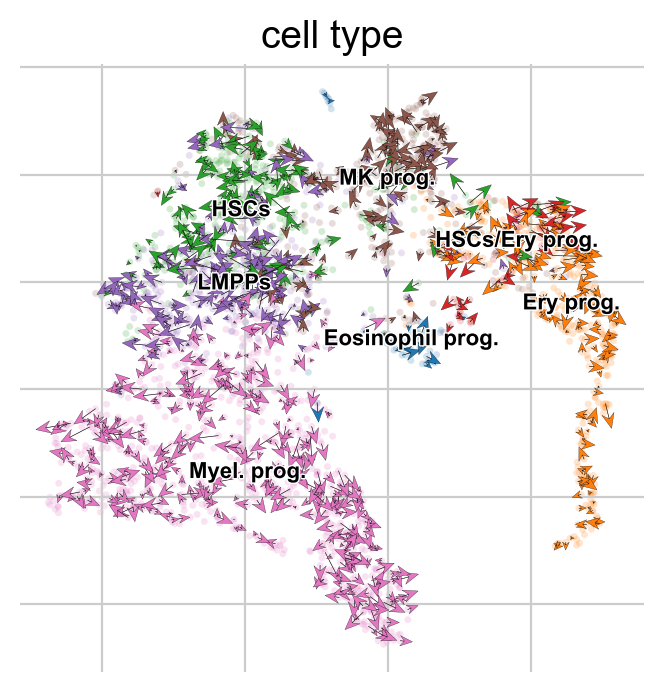

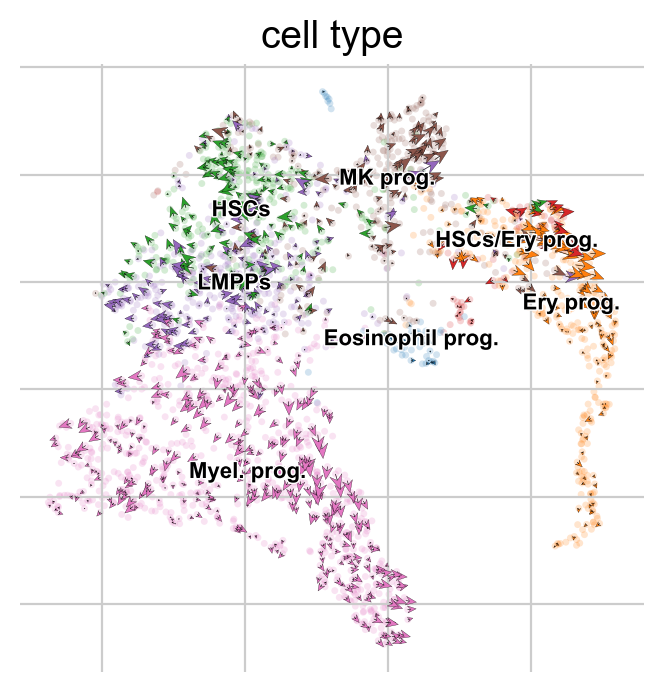

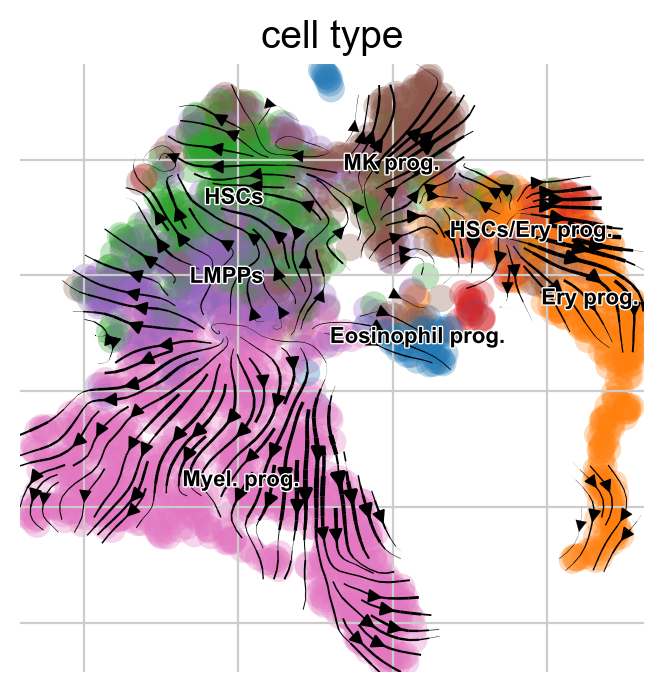

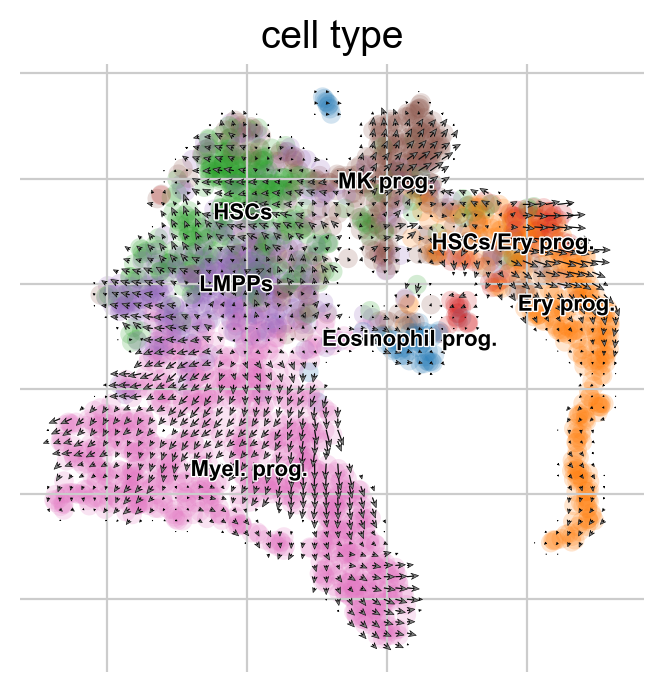

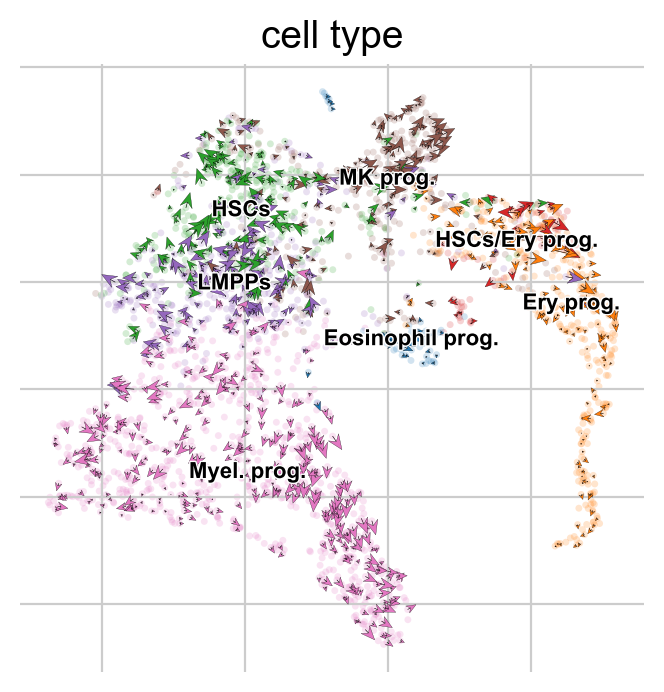

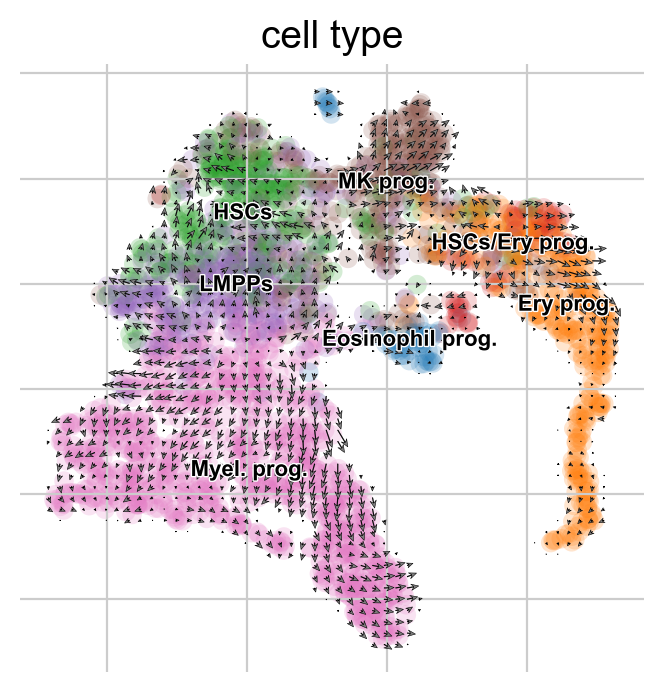

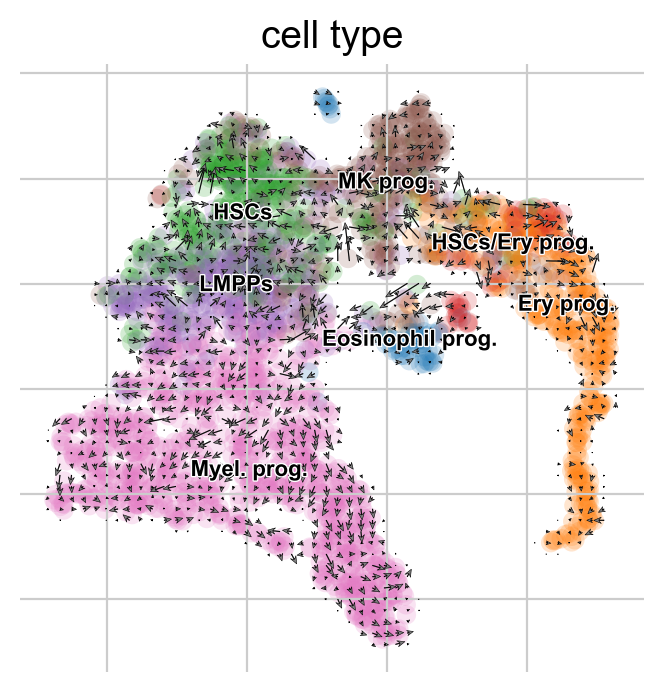

In [40]:
scv.pl.velocity_embedding(ydata, basis='umap', color='cell_type', dpi=100,
                          density=0.4,
                          arrow_size=4,
                          arrow_length=4,
                          show=False,
                          legend_loc='on data',
                          #legend_loc='best',
                          #fontsize=8,
                          legend_fontsize=8,
                         )
scv.pl.velocity_embedding(ydata, basis='umap_smooth', color='cell_type', dpi=100,
                          density=0.4,
                          arrow_size=4,
                          arrow_length=4,
                          show=False,
                          legend_loc='on data',
                          #legend_loc='best',
                          #fontsize=8,
                          legend_fontsize=8,
                         )
scv.pl.velocity_embedding_stream(ydata, basis='umap_smooth', color='cell_type', dpi=100,
                          #density=0.4,
                          #arrow_size=4,
                          #arrow_length=4,
                          show=False,
                          legend_loc='on data',
                          #legend_loc='best',
                          #fontsize=8,
                          legend_fontsize=8,
                         )
scv.pl.velocity_embedding_grid(ydata, basis='umap_smooth', color='cell_type', dpi=100,
                          #density=0.4,
                          arrow_size=2,
                          arrow_length=2,
                          show=False,
                          legend_loc='on data',
                          #legend_loc='best',
                          #fontsize=8,
                          legend_fontsize=8,
                         )
scv.pl.velocity_embedding(xdata, basis='umap_smooth', color='cell_type', dpi=100,
                          density=0.4,
                          arrow_size=4,
                          arrow_length=4,
                          show=False,
                          legend_loc='on data',
                          #legend_loc='best',
                          #fontsize=8,
                          legend_fontsize=8,
                         )
scv.pl.velocity_embedding_grid(xdata, basis='umap_smooth', color='cell_type', dpi=100,
                          #density=0.4,
                          arrow_size=2,
                          arrow_length=2,
                          show=False,
                          legend_loc='on data',
                          #legend_loc='best',
                          #fontsize=8,
                          legend_fontsize=8,
                         )
scv.pl.velocity_embedding_grid(xdata, basis='umap', color='cell_type', dpi=100,
                          #density=0.4,
                          arrow_size=2,
                          arrow_length=2,
                          show=False,
                          legend_loc='on data',
                          #legend_loc='best',
                          #fontsize=8,
                          legend_fontsize=8,
                         )

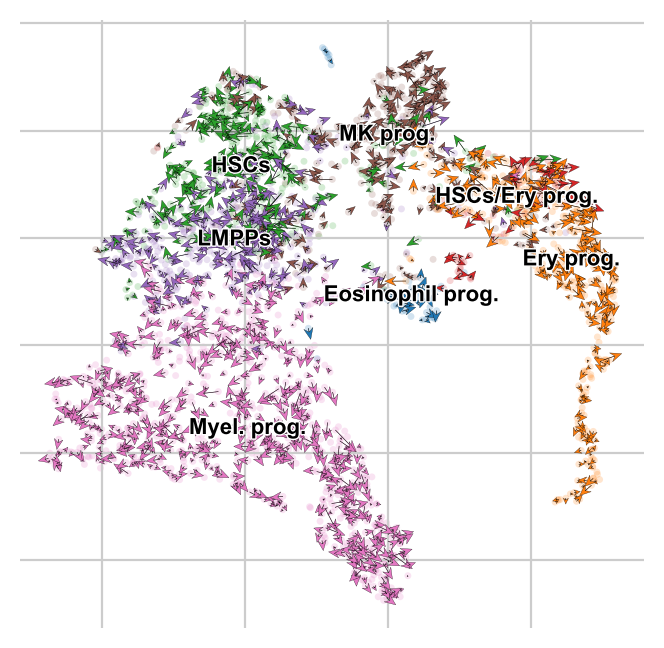

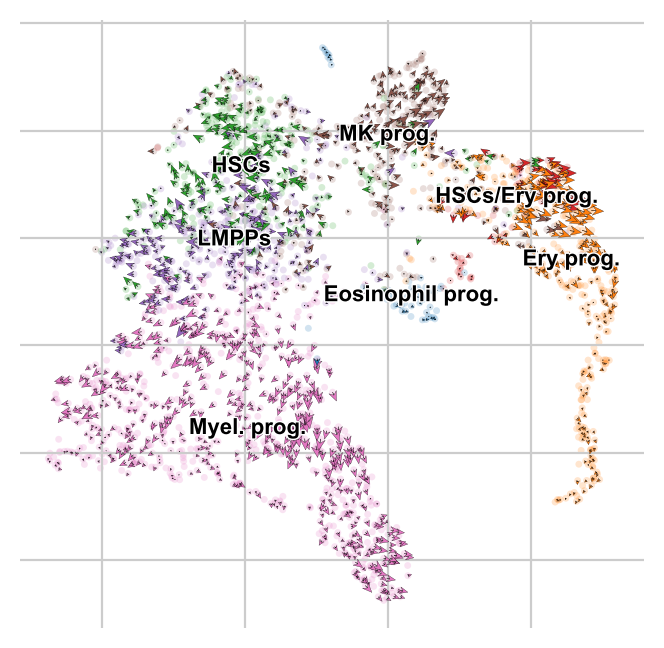

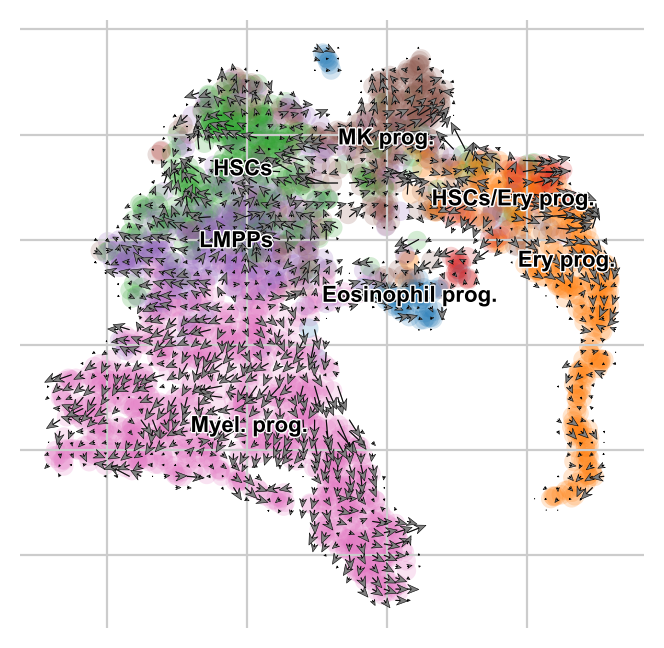

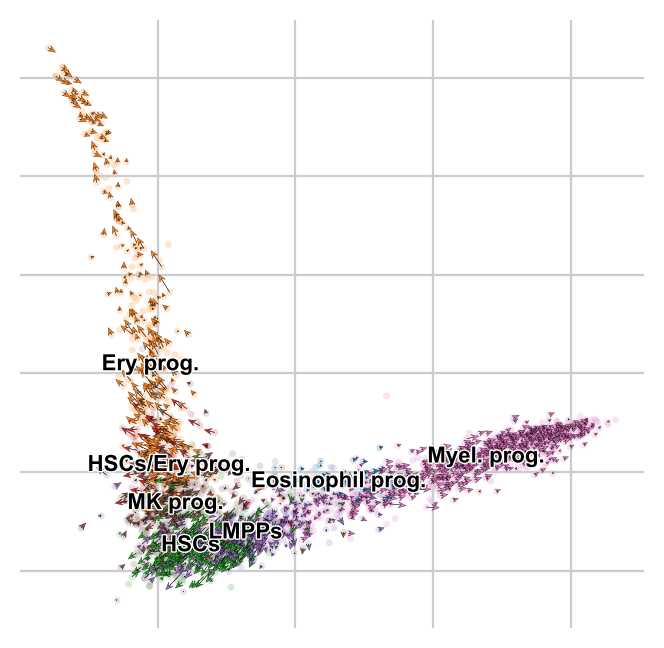

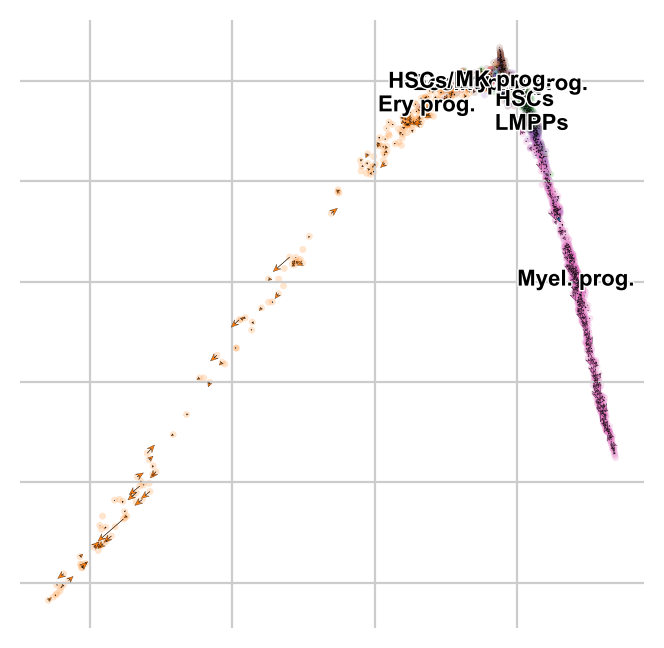

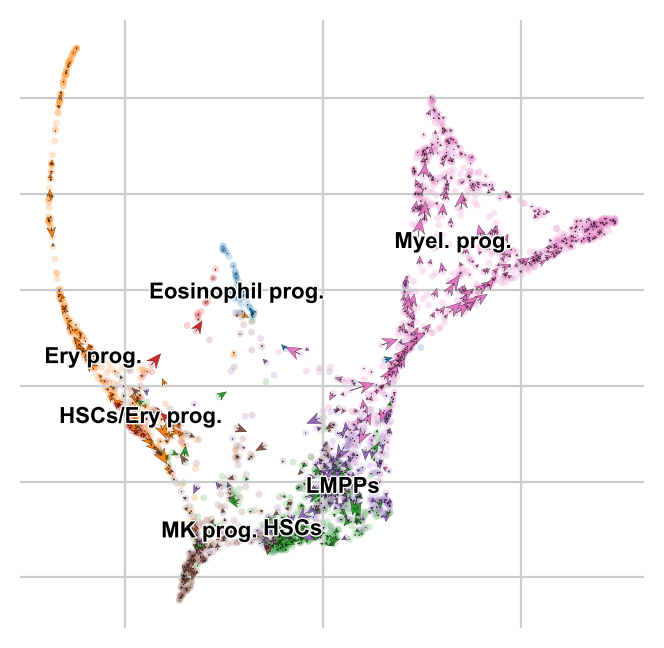

In [41]:
scv.pl.velocity_embedding(ydata, basis='umap', color='cell_type', dpi=100,
                          density=0.7,
                          arrow_size=3,
                          arrow_length=3,
                          show=False,
                          legend_loc='on data',
                          title='',
                          #legend_loc='best',
                          #fontsize=8,
                          legend_fontsize=8,
                         )
plt.savefig(f"{save_dir}/bonemarrow_brigitte_exovelo_umap.pdf", dpi=100, bbox_inches='tight', backend='cairo', transparent=True,)
scv.pl.velocity_embedding(ydata, basis='umap_smooth', color='cell_type', dpi=100,
                          density=0.7,
                          arrow_size=3,
                          arrow_length=3,
                          show=False,
                          legend_loc='on data',
                          title='',
                          #legend_loc='best',
                          #fontsize=8,
                          legend_fontsize=8,
                         )
plt.savefig(f"{save_dir}/bonemarrow_brigitte_exovelo_umap_smooth.pdf", dpi=100, bbox_inches='tight', backend='cairo', transparent=True,)
scv.pl.velocity_embedding_grid(ydata, basis='umap', color='cell_type', dpi=100,
                          density=1.0,
                          arrow_size=3,
                          arrow_length=3,
                          show=False,
                          legend_loc='on data',
                          title='',
                          #legend_loc='best',
                          #fontsize=8,
                          legend_fontsize=8,
                         )
plt.savefig(f"{save_dir}/bonemarrow_brigitte_exovelo_umap_grid.pdf", dpi=100, bbox_inches='tight', backend='cairo', transparent=True,)

scv.pl.velocity_embedding(ydata, basis='pca', color='cell_type', dpi=100,
                          density=0.7,
                          arrow_size=2,
                          arrow_length=1,
                          show=False,
                          legend_loc='on data',
                          title='',
                          #legend_loc='best',
                          #fontsize=8,
                          legend_fontsize=8,
                         )
plt.savefig(f"{save_dir}/bonemarrow_brigitte_exovelo_pca.pdf", dpi=100, bbox_inches='tight', backend='cairo', transparent=True,)
scv.pl.velocity_embedding(ydata, basis='diffmap', color='cell_type', dpi=100,
                          density=0.7,
                          arrow_size=2,
                          arrow_length=1,
                          show=False,
                          legend_loc='on data',
                          title='',
                          #legend_loc='best',
                          #fontsize=8,
                          legend_fontsize=8,
                         )
plt.savefig(f"{save_dir}/bonemarrow_brigitte_exovelo_diffmap.pdf", dpi=100, bbox_inches='tight', backend='cairo', transparent=True,)
scv.pl.velocity_embedding(ydata, basis='draw_graph_fa', color='cell_type', dpi=100,
                          density=0.5,
                          arrow_size=4,
                          arrow_length=2,
                          show=False,
                          legend_loc='on data',
                          title='',
                          #legend_loc='best',
                          #fontsize=8,
                          legend_fontsize=8,
                         )
plt.savefig(f"{save_dir}/bonemarrow_brigitte_exovelo_drawgraph.pdf", dpi=100, bbox_inches='tight', backend='cairo', transparent=True,)

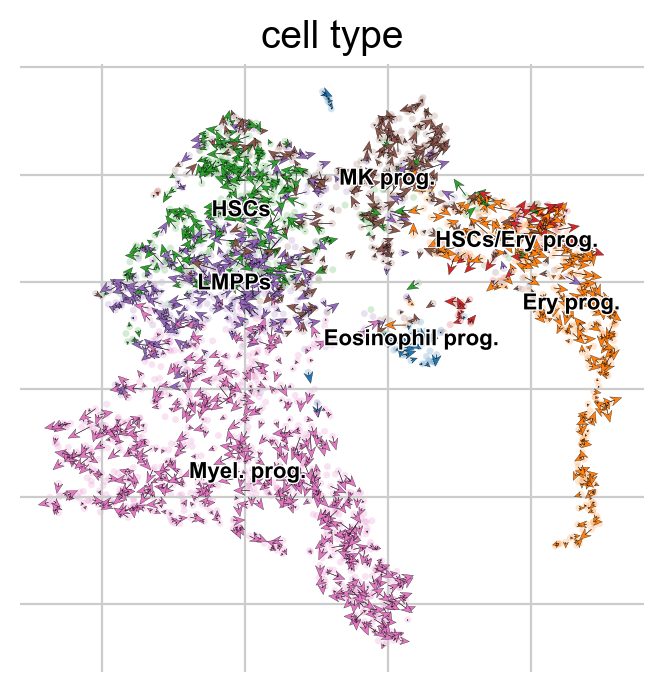

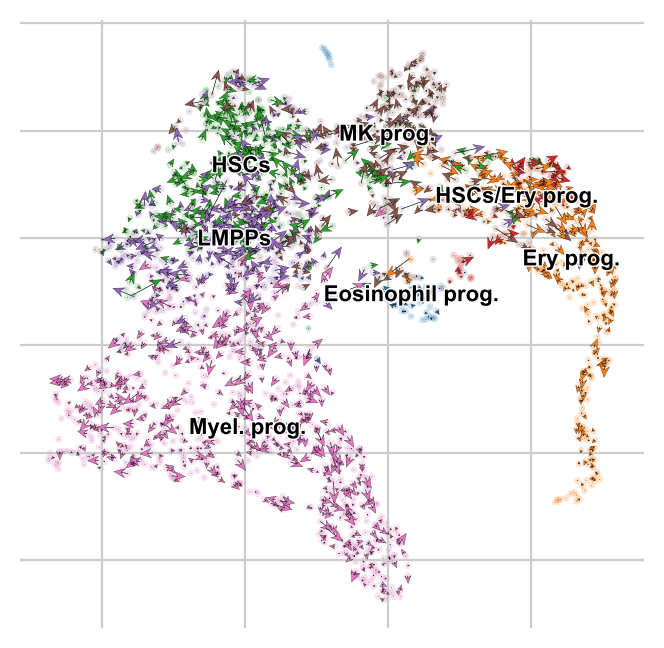

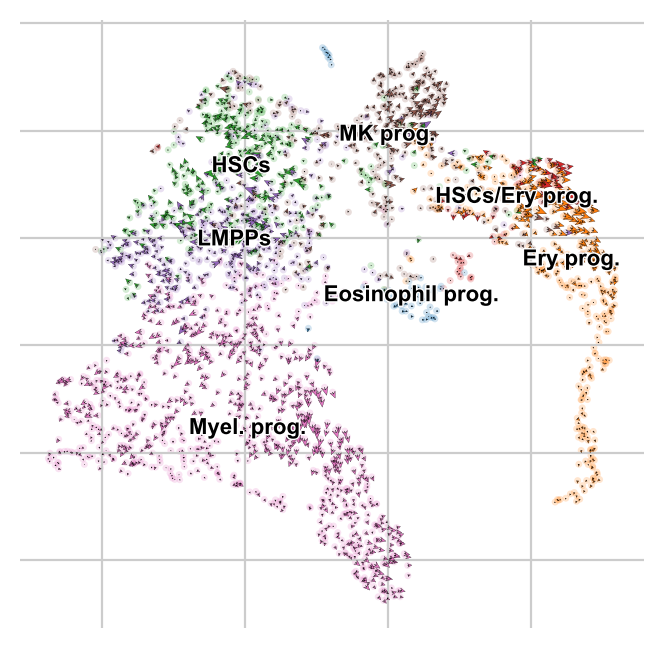

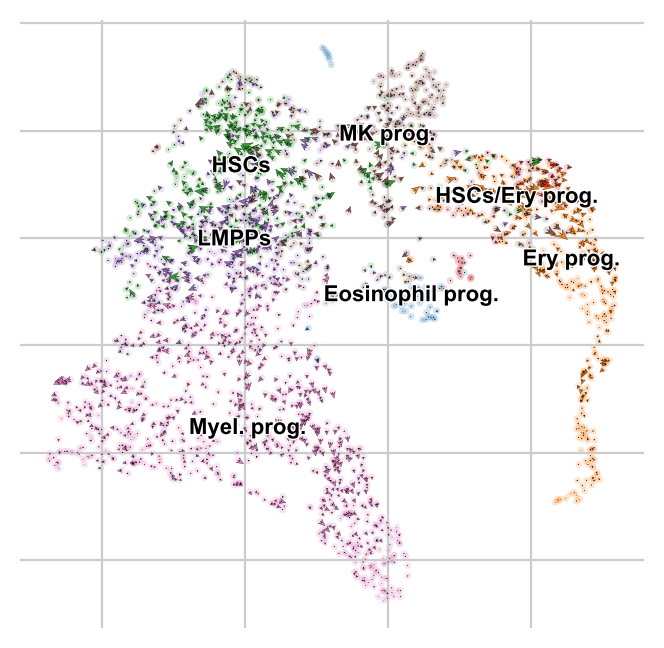

In [42]:
scv.pl.velocity_embedding(ydata, basis='umap', color='cell_type', dpi=100,
                          density=0.7,
                          arrow_size=3,
                          arrow_length=3,
                          show=False,
                          legend_loc='on data',
                          #legend_loc='best',
                          #fontsize=8,
                          legend_fontsize=8,
                         )

n = adata.n_obs
tree = BallTree(Xp[:,:], metric='minkowski', p=2)
k=8
_, ind = tree.query(Zp[:,:], k=k)
_, ind0 = tree.query(Xp[:,:], k=k)
Y0 = ydata[:n].obsm['X_umap']
Y1 = Y0[ind[:,1:]].mean(1)
Y10 = Y0[ind0[:,1:]].mean(1)
V = (Y1 - Y10)
ydata.obsm['X_umap_prj'] = Y0.copy()
ydata.obsm['velocity_umap_prj'] = V.copy()

scv.pl.velocity_embedding(ydata, basis='umap_prj', color='cell_type', dpi=100,
                          density=1.0,
                          arrow_size=3,
                          arrow_length=1,
                          show=False,
                          legend_loc='on data',
                          title='',
                          #legend_loc='best',
                          #fontsize=8,
                          legend_fontsize=8,
                         )
plt.savefig(f"{save_dir}/bonemarrow_brigitte_exovelo_umap_prj.pdf", dpi=100, bbox_inches='tight', backend='cairo', transparent=True,)

Y0 = ydata[:n].obsm['X_umap_smooth']
Y1 = Y0[ind[:,1:]].mean(1)
Y10 = Y0[ind0[:,1:]].mean(1)
V = (Y1 - Y10)[ind0].mean(1)
ydata.obsm['X_umap_smooth_prj'] = Y0.copy()
ydata.obsm['velocity_umap_smooth_prj'] = V.copy()

scv.pl.velocity_embedding(ydata, basis='umap_smooth', color='cell_type', dpi=100,
                          density=1.0,
                          arrow_size=3,
                          arrow_length=2,
                          show=False,
                          legend_loc='on data',
                          title='',
                          #legend_loc='best',
                          #fontsize=8,
                          legend_fontsize=8,
                         )
scv.pl.velocity_embedding(ydata, basis='umap_smooth_prj', color='cell_type', dpi=100,
                          density=1.0,
                          arrow_size=3,
                          arrow_length=1,
                          show=False,
                          legend_loc='on data',
                          title='',
                          #legend_loc='best',
                          #fontsize=8,
                          legend_fontsize=8,
                         )
plt.savefig(f"{save_dir}/bonemarrow_brigitte_exovelo_umap_smooth_prj.pdf", dpi=100, bbox_inches='tight', backend='cairo', transparent=True,)

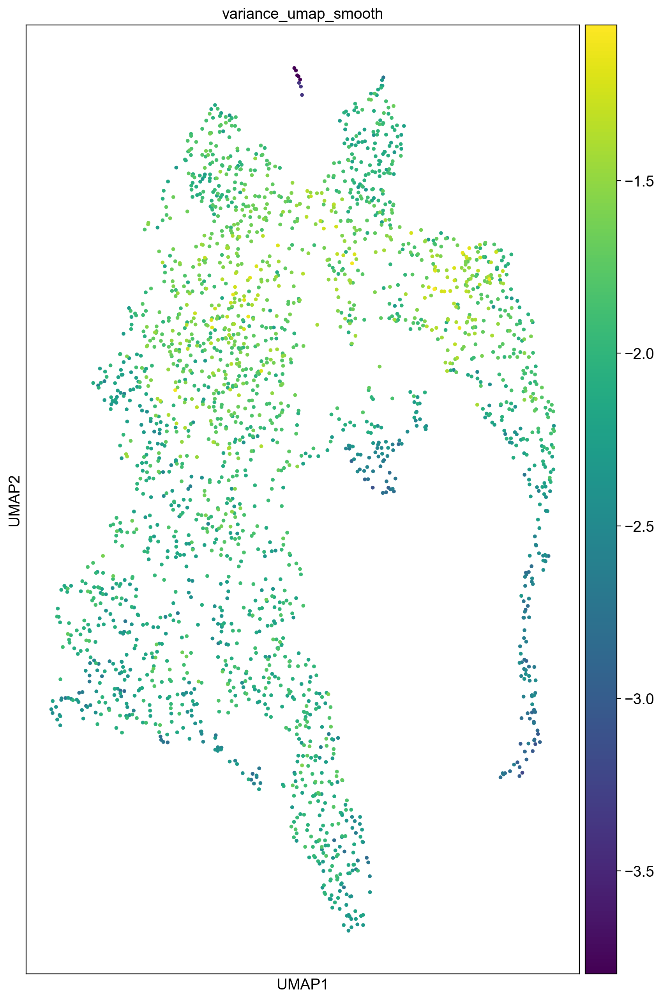

In [43]:
### variance plot
## Plots
#dist, ind = treeX.query(Xp, k=12)
#ydata.obsm['X_umap2'] = ydata.obsm['X_umap'].copy()
#ydata.obsm['velocity_umap2'] = ydata.obsm['velocity_umap'][ind].mean(1)
out = ydata.obsm['velocity_umap_smooth'][ind] #(n_obs, k_nns, d_dims)
out = out - out.mean(1, keepdims=True)
out = np.einsum("nkd,nkd->n", out, out)
out = np.log10(out)
ydata.obs['variance_umap_smooth'] = out
fig, ax = plt.subplots(dpi=100, figsize=(10,16), nrows=1, ncols=1)
sc.pl.umap(
    ydata,
    color='variance_umap_smooth',
    ax=ax,
)

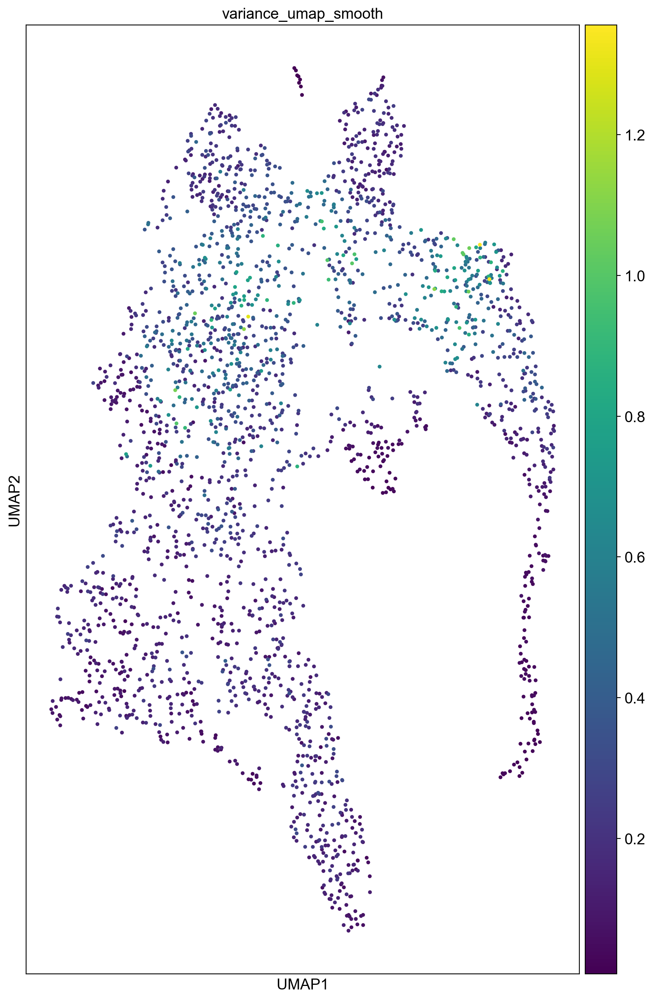

In [44]:
### variance plot
## Plots
#dist, ind = treeX.query(Xp, k=12)
#ydata.obsm['X_umap2'] = ydata.obsm['X_umap'].copy()
#ydata.obsm['velocity_umap2'] = ydata.obsm['velocity_umap'][ind].mean(1)
n = adata.n_obs
tree = BallTree(Xp[:,:], metric='minkowski', p=2)
k=12
#_, ind = tree.query(Zp[:,:], k=k)
_, ind = tree.query(Xp[:,:], k=k)
####
out = ydata.obsm['velocity_umap_smooth'][ind] #(n_obs, k_nns, d_dims)
out = out - out.mean(1, keepdims=True)
#out = np.einsum("nkd,nkd->n", out, out)
out = np.einsum("nkd,nkd->n", out, out).clip(0,0.3)*10
#out = np.log10(out)
ydata.obs['variance_umap_smooth'] = out
fig, ax = plt.subplots(dpi=100, figsize=(10,16), nrows=1, ncols=1)
sc.pl.umap(
    ydata,
    color='variance_umap_smooth',
    ax=ax,
)

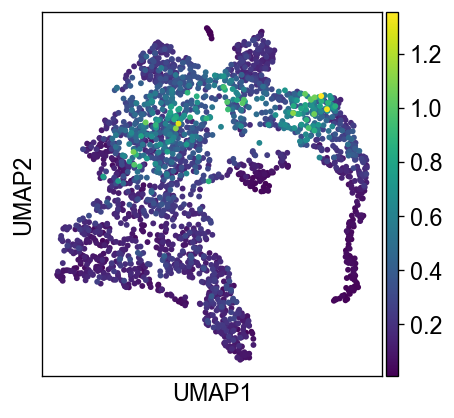

In [45]:
sc.pl.umap(
    ydata,
    color='variance_umap_smooth',
    show=False,
    title='',
)
plt.savefig(f"{save_dir}/bonemarrow_brigitte_exovelo_umap_variance.pdf", dpi=100, bbox_inches='tight', backend='cairo', transparent=True,)